<a href="https://colab.research.google.com/github/hamdani2020/Computer-vision_Photogrammetry/blob/main/Lab1_detect.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# https://drive.google.com/file/d/1X_wUTcbD4LdETYxLGSuzWarDpOpYKu9K/view?usp=share_link

!gdown 1X_wUTcbD4LdETYxLGSuzWarDpOpYKu9K

Downloading...
From: https://drive.google.com/uc?id=1X_wUTcbD4LdETYxLGSuzWarDpOpYKu9K
To: /content/balloons.zip
100% 38.7M/38.7M [00:00<00:00, 42.6MB/s]


In [ ]:
!rm -rf balloons
!unzip balloons.zip
!apt install tree

# Installing Python Packages

In [ ]:
!pip install ultralytics

# Helpers

In [ ]:
import os
import sys
import cv2
import json
import numpy as np
import shutil
from glob import glob
from matplotlib import pyplot as plt
from IPython import display
from IPython.display import display, Image
from glob import glob
import ultralytics
from ultralytics import YOLO
from ultralytics.yolo.utils.plotting import Annotator

BLUE_BGR, GREEN_BGR, RED_BGR = (255, 0, 0), (255, 255, 0), (0, 0, 255)


def yolo_normalize_box(box, width, height):
    dw = 1.0 / width
    dh = 1.0 / height
    xmin, ymin, xmax, ymax = box[:4]
    x = (xmin + xmax) / 2.0 - 1
    y = (ymin + ymax) / 2.0 - 1
    w = xmax - xmin
    h = ymax - ymin
    x = x * dw
    w = w * dw
    y = y * dh
    h = h * dh
    return x, y, w, h


def yolo_norm_coords(coordinates, width, height):
    dw = 1.0 / width
    dh = 1.0 / height
    return [(x * dw, y * dh) for x, y in coordinates]


# expects image as bgr
def polyline(im, pln, is_closed=False, color=GREEN_BGR, thickness=2, lineType=cv2.LINE_AA):
    coords = np.array(pln, np.int32)
    coords = coords.reshape((-1, 1, 2))
    return cv2.polylines(im, [coords],
                         isClosed=is_closed, color=color, thickness=thickness, lineType=lineType)


def visualize_box(annotation, line_width=2, color=(250, 200, 255), txt_color=(0, 0, 255), label=""):
    folder = os.path.dirname(annotation)
    data = json.load(open(annotation))
    img = os.path.join(folder, data['filename'])
    im = cv2.imread(img)
    im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
    annotator = Annotator(im, line_width=line_width)
    boxes = []
    labels = []
    if 'boxes' in data:
        boxes = [o for _, o in data['boxes'].items()]
        labels = [label] * len(boxes)
    else :
        for ann in  data['annotations'] :
            boxes.append(ann['box'])
            labels.append(ann['label'])


    for i, box in enumerate(boxes):
        annotator.box_label(box, labels[i], color=color, txt_color=txt_color)
    return annotator.result()


def visualize_polygon(annotation, color=GREEN_BGR, line_width=2, lineType=cv2.LINE_AA):
    folder = os.path.dirname(annotation)
    data = json.load(open(annotation))
    img = os.path.join(folder, data['filename'])
    if 'regions' in data:
        coordinates = [o for _, o in data['regions'].items()]
    else:
        coordinates = [o['region'] for o in data['annotations']]

    im = cv2.imread(img)
    for coords in coordinates:
        im = polyline(im, coords, is_closed=True, color=color, thickness=line_width, lineType=lineType)
    return cv2.cvtColor(im, cv2.COLOR_BGR2RGB)


def export_image_label(class_id, filename, outdir, key='boxes'):
    folder = os.path.dirname(filename)
    data = json.load(open(filename))
    width = data['width']
    height = data['height']
    img_name = data['filename']

    name = os.path.splitext(img_name)[0]
    items = [o for _, o in data[key].items()]
    label = os.path.join(outdir, f"labels/{name}.txt")

    src_img = os.path.join(folder, img_name)
    dst_img = os.path.join(outdir, "images", data['filename'])
    shutil.copyfile(src_img, dst_img)

    with open(label, 'w') as fid:
        for item in items:
            if key == 'regions':
                item = yolo_norm_coords(item, width=width, height=height)
                ann = str(class_id)
                for pt in item:
                    ann += " " + f"{pt[0]} {pt[1]}"
                fid.write(f"{ann}\n")
            else:
                item = yolo_normalize_box(item, width=width, height=height)
                fid.write(str(class_id) + " " + " ".join([str(a) for a in item]) + '\n')


def create_devkit_subs(directory):
    subs = ['images', 'labels']
    for sub in subs:
        os.makedirs(os.path.join(directory, sub), exist_ok=True)


def export_devkit(class_id, annotation_files, output, key='boxes'):
    for file in annotation_files:
        export_image_label(class_id, file, output, key=key)


# Test Pretrained Models on Our Dataset

In [ ]:
ultralytics.checks()

Ultralytics YOLOv8.0.90 🚀 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 23.5/78.2 GB disk)


In [ ]:
home = os.getcwd()
balloons = f"{home}/balloons"
# small https://github.com/ultralytics/assets/releases/download/v0.0.0/yolov8s.pt
model = YOLO("yolov8s.pt")
results = model.predict(
    source="/content/balloons/valid/16335852991_f55de7958d_k.jpg",
    conf=0.25,
    save=True
)

100%|██████████| 21.5M/21.5M [00:00<00:00, 157MB/s]

image 1/1 /content/balloons/valid/16335852991_f55de7958d_k.jpg: 640x480 1 person, 162.0ms
Speed: 15.7ms preprocess, 162.0ms inference, 57.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict


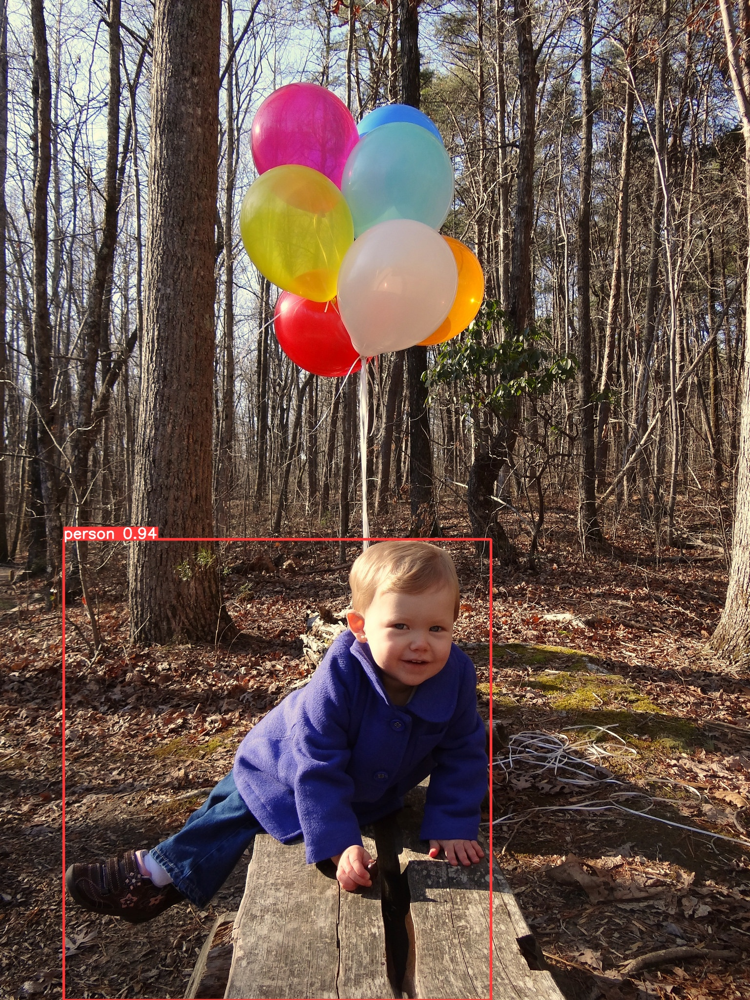

In [ ]:
Image("runs/detect/predict/16335852991_f55de7958d_k.jpg", width=500)

# Yolo Data Preparation

## Yolo custom data structure - training
- devkit
  - balloons
    * train
      1. images
      2. labels
  * Valid
    1. images
    2. labels

In [ ]:
# location of yolo train and valid sets
out_train = "devkit/balloons/train"
out_valid = "devkit/balloons/valid"
create_devkit_subs(out_train)
create_devkit_subs(out_valid)

# input data

train_files= glob(f"{balloons}/train/*.json")
valid_files= glob(f"{balloons}/valid/*.json")

# devkit
classes = ["balloon", "person", "mango"]
class_id = classes.index("balloon")
export_devkit(class_id, train_files, out_train)
export_devkit(class_id, valid_files, out_valid)

# Loading Tensorboard

In [ ]:
# Load the TensorBoard notebook extension
#%load_ext tensorboard
#%tensorboard --logdir runs/detect/

%reload_ext tensorboard
%tensorboard --logdir runs/detect/

Reusing TensorBoard on port 6006 (pid 19486), started 0:07:24 ago. (Use '!kill 19486' to kill it.)

<IPython.core.display.Javascript object>

# Yolov8 Training

notes: [Notes on when to stop](https://github.com/AlexeyAB/darknet#when-should-i-stop-training)

In [ ]:
model = YOLO("yolov8s.pt")
model.train(
    data='data.yaml',
    epochs=10,
    imgsz=640,
    name='train-balloon'
)

Ultralytics YOLOv8.0.90 🚀 Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=data.yaml, epochs=10, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train-balloon, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=0, resume=False, amp=True, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=None, w

# Inference

In [ ]:
model_pt = "runs/detect/train-balloon/weights/best.pt"
model = YOLO(model_pt)
results = model.predict(
    source="/content/balloons/valid",
    conf=0.5,
    save=True,
    hide_labels=True,
    hide_conf=True,
    line_thickness=2
)

WARNING ⚠️ 'hide_labels' is deprecated and will be removed in 'ultralytics 8.2' in the future. Please use 'show_labels' instead.
WARNING ⚠️ 'hide_conf' is deprecated and will be removed in 'ultralytics 8.2' in the future. Please use 'show_conf' instead.

image 1/13 /content/balloons/valid/14898532020_ba6199dd22_k.jpg: 448x640 5 balloons, 13.9ms
image 2/13 /content/balloons/valid/16335852991_f55de7958d_k.jpg: 640x480 7 balloons, 13.1ms
image 3/13 /content/balloons/valid/24631331976_defa3bb61f_k.jpg: 640x416 1 balloon, 14.7ms
image 4/13 /content/balloons/valid/2917282960_06beee649a_b.jpg: 448x640 2 balloons, 18.8ms
image 5/13 /content/balloons/valid/3800636873_ace2c2795f_b.jpg: 640x448 1 balloon, 22.5ms
image 6/13 /content/balloons/valid/3825919971_93fb1ec581_b.jpg: 640x448 7 balloons, 12.0ms
image 7/13 /content/balloons/valid/410488422_5f8991f26e_b.jpg: 480x640 3 balloons, 31.3ms
image 8/13 /content/balloons/valid/4581425993_72b9b15fc0_b.jpg: 640x512 1 balloon, 13.1ms
image 9/13 /conten

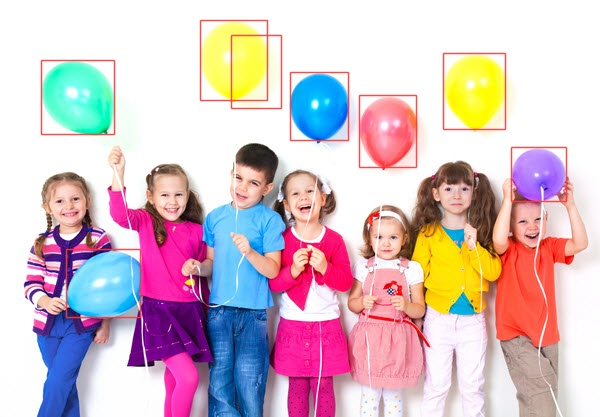

In [ ]:
Image("runs/detect/predict4/Kids-Party-Balloon-Entertainment.jpg", width=500)

# Needed files

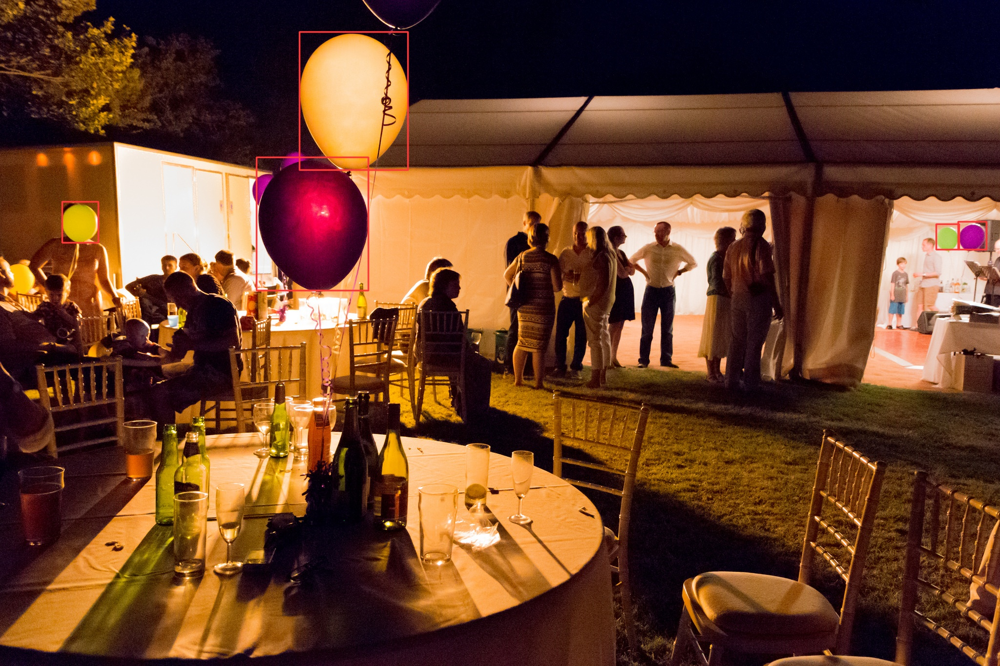

In [ ]:
files = glob("runs/detect/predict7/*.jpg")
files

images = [Image(img) for img in files]
images[6]